## Setup


In [0]:
! [[ -f data.zip ]] || wget -q https://www.dropbox.com/s/m1ie2zq8nkburar/data.zip?raw=1 -O data.zip && unzip -q data.zip

In [0]:
! [[ -d protodune-unet ]] || git clone --quiet https://github.com/sdll/protodune-unet.git

In [3]:
! pip install -q gsheet-keyring ipython-secrets comet_ml tqdm

     |████████████████████████████████| 184kB 4.2MB/s 
     |████████████████████████████████| 204kB 50.4MB/s 
     |████████████████████████████████| 409kB 43.2MB/s 
     |████████████████████████████████| 2.3MB 49.3MB/s 


In [2]:
%cd /content/protodune-unet

/content/protodune-unet


In [9]:
! git pull

remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (1/1), done.
remote: Total 4 (delta 3), reused 4 (delta 3), pack-reused 0
Unpacking objects: 100% (4/4), done.
From https://github.com/sdll/protodune-unet
   6117295..65a1c09  master     -> origin/master
Updating 6117295..65a1c09
Fast-forward
 unet/model.py | 6 +++---
 1 file changed, 3 insertions(+), 3 deletions(-)


## Imports

In [0]:
from comet_ml import Experiment 

import argparse
from pathlib import Path

import matplotlib.pyplot as plt
from matplotlib import animation
import numpy as np
import pandas as pd
import seaborn as sns
import torch
from torch import nn, optim
import torch.nn.functional as F
from tqdm import tqdm as tqdm_base
from ipython_secrets import get_secret

from utils.metrics import psnr, ssim
from utils.dataset import PlaneLoader
from unet import UNet as Model
from timeit import default_timer as timer
import cv2

sns.set()


def tqdm(*args, **kwargs):
    if hasattr(tqdm_base, "_instances"):
        for instance in list(tqdm_base._instances):
            tqdm_base._decr_instances(instance)
    return tqdm_base(*args, **kwargs)

## Environment

In [0]:
DATA_PATH = "/content/data"
GROUND_TRUTH_LABEL = "ground_truth"
NOISY_IMAGES_LABEL = "noisy"
TRAIN_LABEL = "train"
TEST_LABEL = "val"
TRAIN_POSTFIX = "normalized_data.tensor"
TEST_POSTFIX = "normalized_data.tensor"
TRAIN_GT_DATA = Path(DATA_PATH) / TRAIN_LABEL / GROUND_TRUTH_LABEL / TRAIN_POSTFIX
TRAIN_NOISY_DATA = Path(DATA_PATH) / TRAIN_LABEL / NOISY_IMAGES_LABEL / TRAIN_POSTFIX
TEST_GT_DATA = Path(DATA_PATH) / TEST_LABEL / GROUND_TRUTH_LABEL / TEST_POSTFIX
TEST_NOISY_DATA = Path(DATA_PATH) / TEST_LABEL / NOISY_IMAGES_LABEL / TEST_POSTFIX

DEVICE = "cuda"

PROJECT = "fastrino"
COMET_ML_API_KEY = get_secret("comet-{}".format(PROJECT))
DRIVE_DIR = "/content/drive"
NUM_EPOCHS=50
MODEL_CHECKPOINT = Path(DRIVE_DIR) / "My Drive" / f"protodune-unet-{NUM_EPOCHS}-epochs.pt"


In [4]:
from google.colab import drive
drive.mount(DRIVE_DIR)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
experiment = Experiment(
    api_key=COMET_ML_API_KEY,
    project_name=PROJECT,
    workspace=PROJECT,
    auto_output_logging=None,
)

COMET INFO: Experiment is live on comet.ml https://www.comet.ml/fastrino/fastrino/d98adf82a33942e89d31f0153cdf4196



## Utilities

In [0]:
def get_arg_parser():
    parser = argparse.ArgumentParser()
    parser.add_argument("--lr", type=float, default=1e-3)
    parser.add_argument("--batch-size", type=int, default=1)
    parser.add_argument("--num-epochs", type=int, default=NUM_EPOCHS)
    parser.add_argument("--seed", type=int, default=42)
    parser.add_argument("--in-channels", default=1)

    return parser


def get_criterion():
    return nn.MSELoss()


def get_optimizer(model, lr=0.001):
    return optim.Adam(model.parameters(), lr)


def train(experiment, model, train_loader):
    parser = get_arg_parser()
    args = parser.parse_args(args=[])

    experiment.log_parameters(vars(args))

    criterion = get_criterion()
    optimizer = get_optimizer(model, args.lr)

    for epoch in tqdm(range(args.num_epochs), desc="Epoch", unit="epochs"):
        with experiment.train():
            train_psnr = []
            train_ssim = []

            for image, noise in tqdm(train_loader, desc=f"Epoch {epoch}", unit="images"):
                image = image.to(DEVICE)
                noise = noise.to(DEVICE)

                prediction = model(image)
                loss = criterion(prediction, noise)

                loss.backward()
                optimizer.step()
                optimizer.zero_grad()

                current_psnr = psnr(image - prediction, image - noise).data.item()
                current_ssim = ssim(image - prediction, image - noise).data.item()
                train_psnr.append(current_psnr)
                train_ssim.append(current_ssim)
                experiment.log_metric("psnr", current_psnr)
                experiment.log_metric("ssim", current_ssim)
                experiment.log_metric("loss", loss.data.item())

            experiment.log_metric("mean_psnr", np.mean(train_psnr))
            experiment.log_metric("mean_ssim", np.mean(train_ssim))
        if epoch % 5 == 0:
            now = timer()
            ckpt = Path(DRIVE_DIR) / "My Drive" / f"protodune-unet-{epoch}-epochs-at-{now}.pt"
            torch.save(model.state_dict(), ckpt)

def test(experiment, model, test_loader):
    with experiment.test():
        model.eval()
        test_psnr = []
        test_ssim = []
        test_prediction_times = []
        for image, noise in tqdm(test_loader, desc="Test images", unit="images"):
            image = image.to(DEVICE)
            noise = noise.to(DEVICE)
            start = timer()
            prediction = model(image)
            end = timer()
            prediction_time = end - start
            test_prediction_times.append(prediction_time)
            experiment.log_metric("prediction_time", prediction_time)
            gt_image = image - noise
            current_psnr = psnr(image - prediction, gt_image).data.item()
            current_ssim = ssim(prediction, gt_image).data.item()
            del prediction, gt_image
            test_psnr.append(current_psnr)
            test_ssim.append(current_ssim)

        test_psnr = np.mean(test_psnr)
        test_ssim = np.mean(test_ssim)
        test_prediction_time = np.mean(test_prediction_times)

        experiment.log_metric("mean_psnr", test_psnr)
        experiment.log_metric("mean_ssim", test_ssim)
        experiment.log_metric("mean_prediction_time", test_prediction_time)

    return test_psnr, test_ssim, test_prediction_time

In [0]:
parser = get_arg_parser()
args = parser.parse_args(args=[])

In [0]:
model = Model(args.in_channels, args.in_channels, feature_dim=32, is_bilinear=False).to(DEVICE)

In [9]:
model.load_state_dict(torch.load(MODEL_CHECKPOINT))

<All keys matched successfully>

In [0]:
train_loader = torch.utils.data.DataLoader(
    PlaneLoader(TRAIN_GT_DATA, TRAIN_NOISY_DATA),
    batch_size=args.batch_size,
    shuffle=True,
)

In [13]:
model.train()
train(experiment, model, train_loader)

Epoch: 100%|██████████| 50/50 [2:13:12<00:00, 159.85s/epochs]


Training log (5 epochs): https://www.comet.ml/fastrino/fastrino/401c0373503241258135eb77689c537f

Training log (5 epochs of pre-training + 50 epochs): https://www.comet.ml/fastrino/fastrino/d98adf82a33942e89d31f0153cdf4196

In [0]:
torch.save(model.state_dict(), MODEL_CHECKPOINT)

In [0]:
del train_loader

In [0]:
test_loader = torch.utils.data.DataLoader(
    PlaneLoader(TEST_GT_DATA, TEST_NOISY_DATA), batch_size=1, shuffle=False
)

In [8]:
model = Model(args.in_channels, args.in_channels, feature_dim=32, is_bilinear=False).to(DEVICE)
model.load_state_dict(torch.load(MODEL_CHECKPOINT))
model.eval()

UNet(
  (inc): DoubleConv(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (down1): Down(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down2): Down(
    (0): MaxPool2d(kernel_size=2, stride=

In [17]:
test_psnr, test_ssim, test_prediction_time = test(experiment, model, test_loader)
print(
    "Mean Test PSNR: {}\nMean Test SSIM: {}\nMean Prediction Time: {}".format(
        test_psnr, test_ssim, test_prediction_time
    )
)

Test images: 100%|██████████| 22/22 [00:06<00:00,  3.56images/s]

Mean Test PSNR: 80.79200224442916
Mean Test SSIM: 0.05335651320902715
Mean Prediction Time: 0.0069794113637313285


Testing log (5 epochs): https://www.comet.ml/fastrino/fastrino/d74c0426962b4a38be14ea4183f7a5bc

Testing log (5 epochs of pre-training + 50 epochs):  https://www.comet.ml/fastrino/fastrino/d98adf82a33942e89d31f0153cdf4196


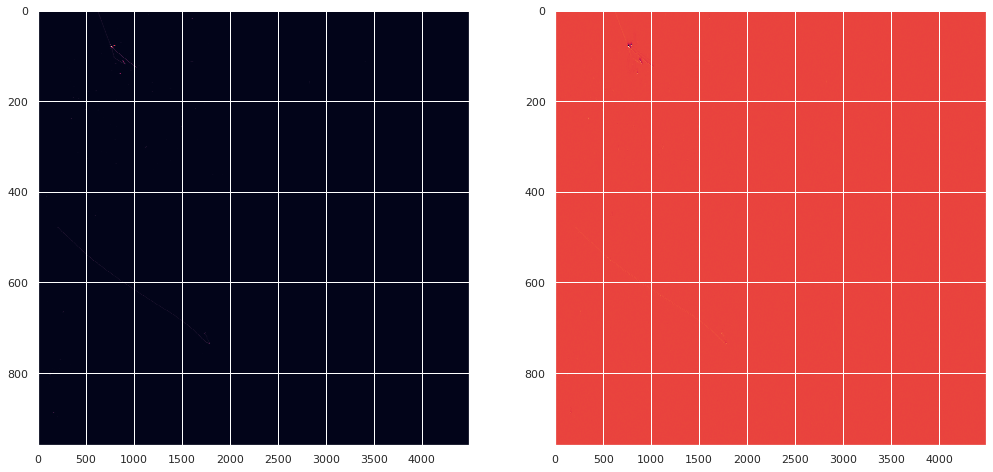

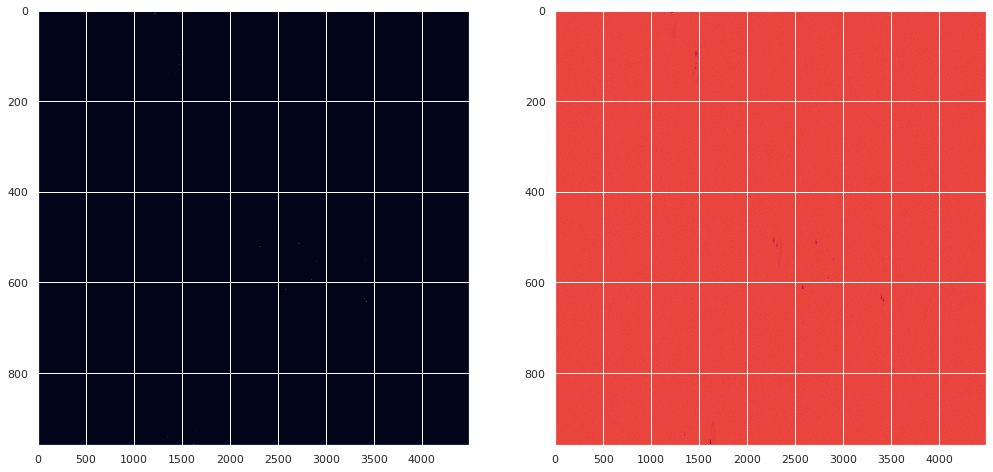

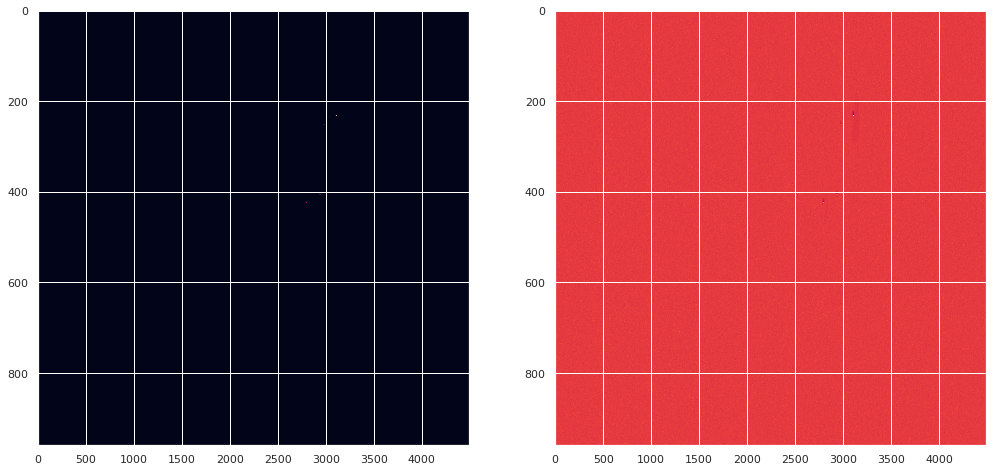

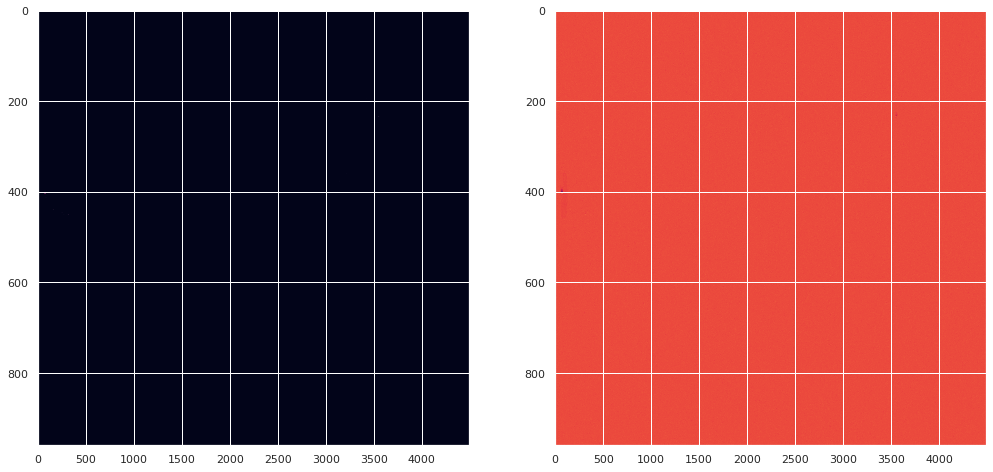

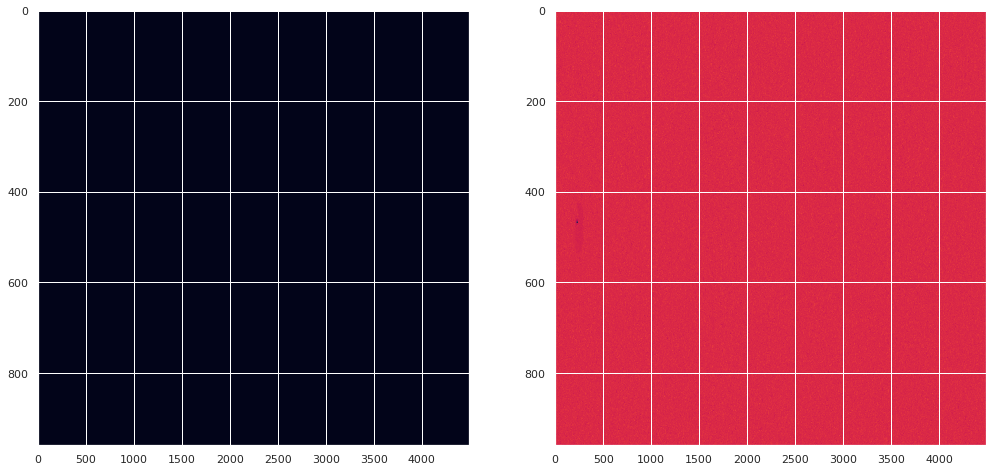

...

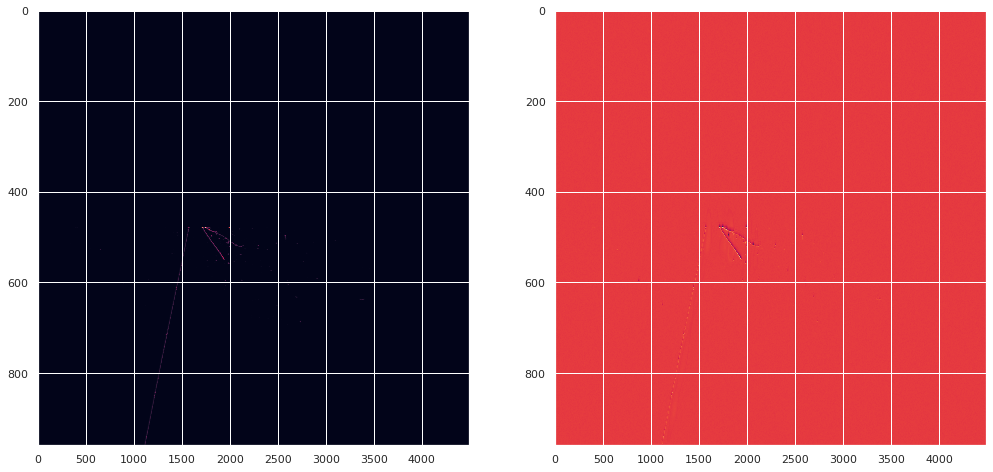

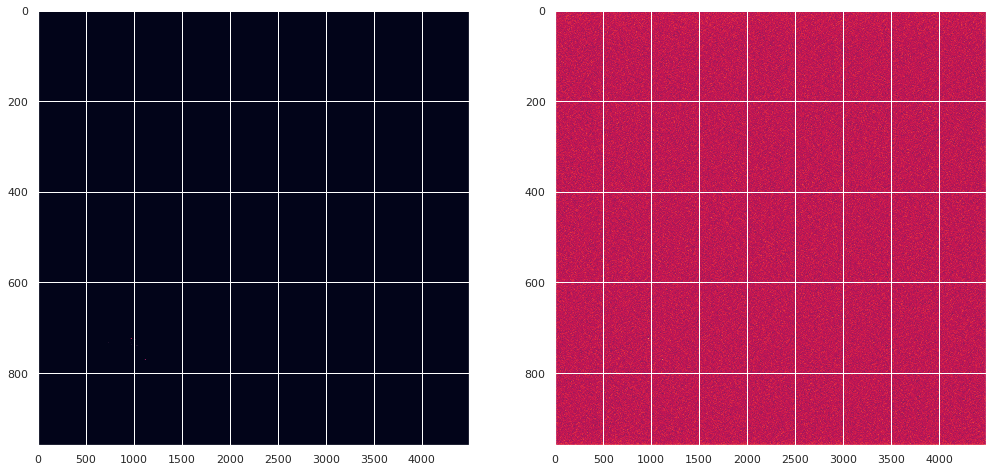

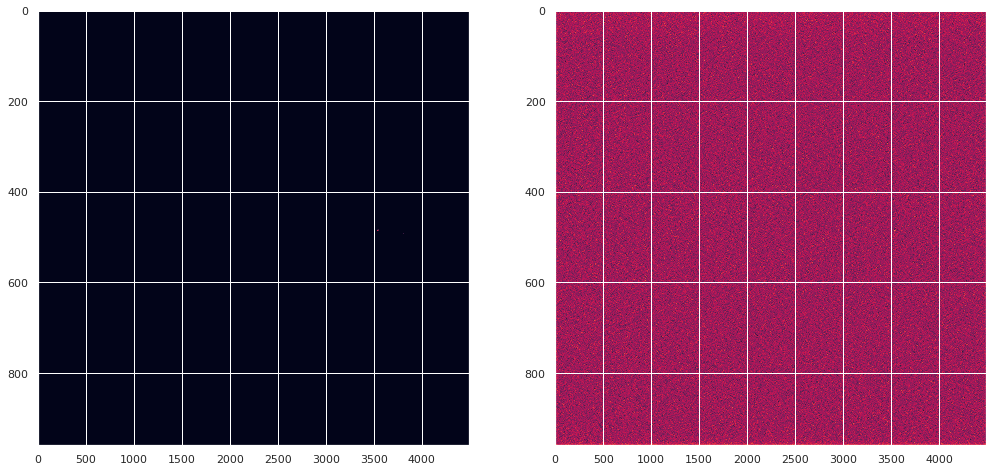

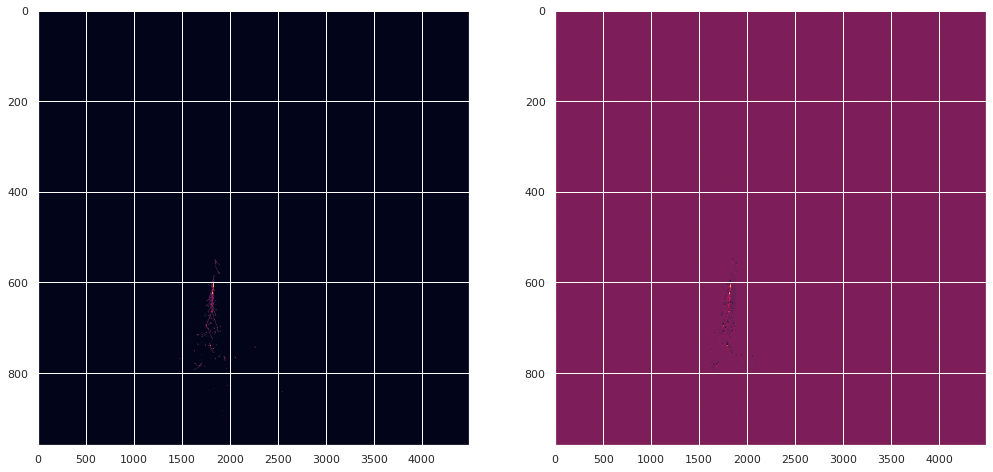

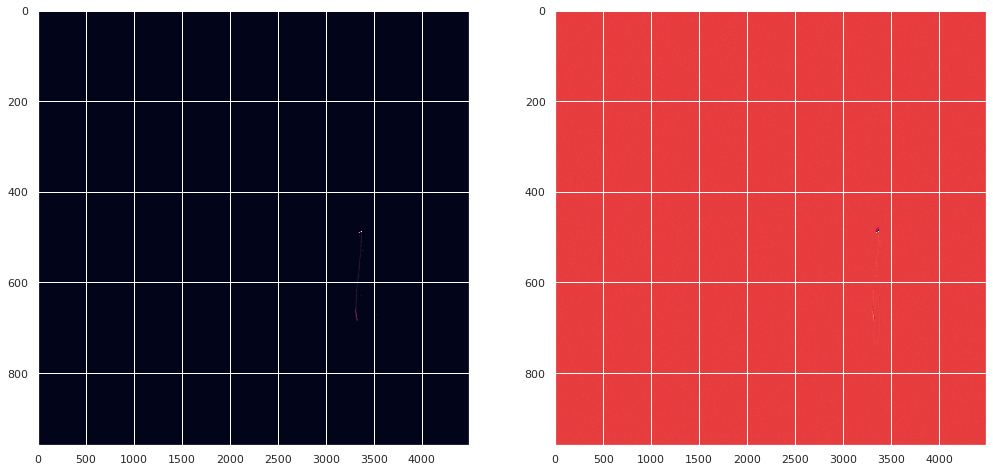

In [18]:
for image, noise in test_loader:
    fig = plt.figure(figsize=(17, 8))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ax1.imshow((image - noise).squeeze(), interpolation='nearest', aspect='auto')
    ax2.imshow((image - model(image.to(DEVICE)).data.to("cpu")).squeeze(),
               interpolation='nearest', aspect='auto')
    plt.show()

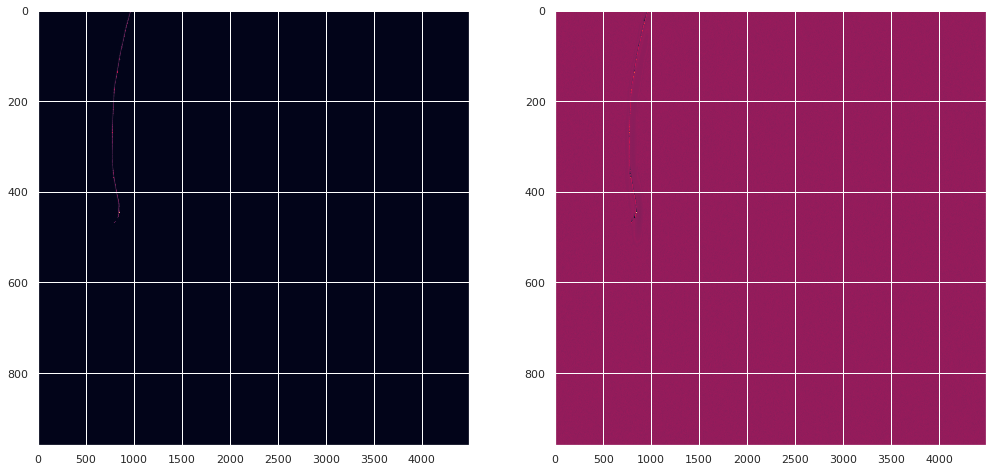

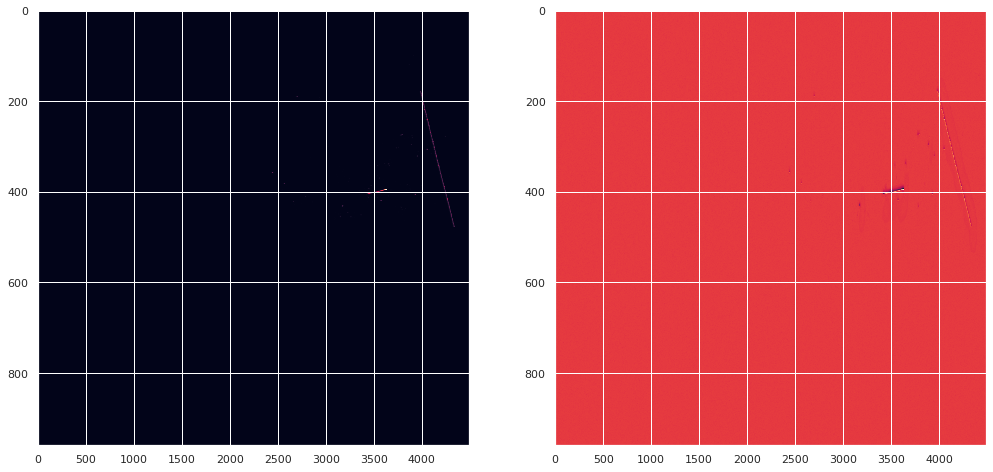

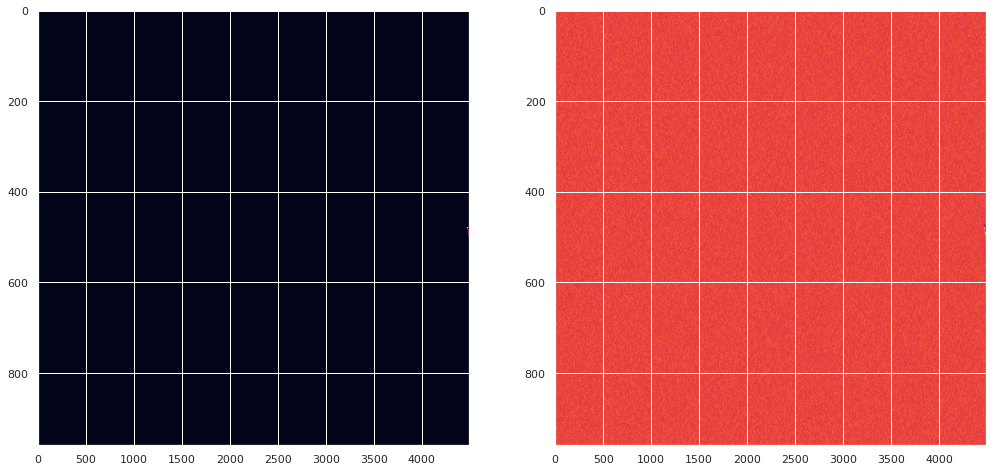

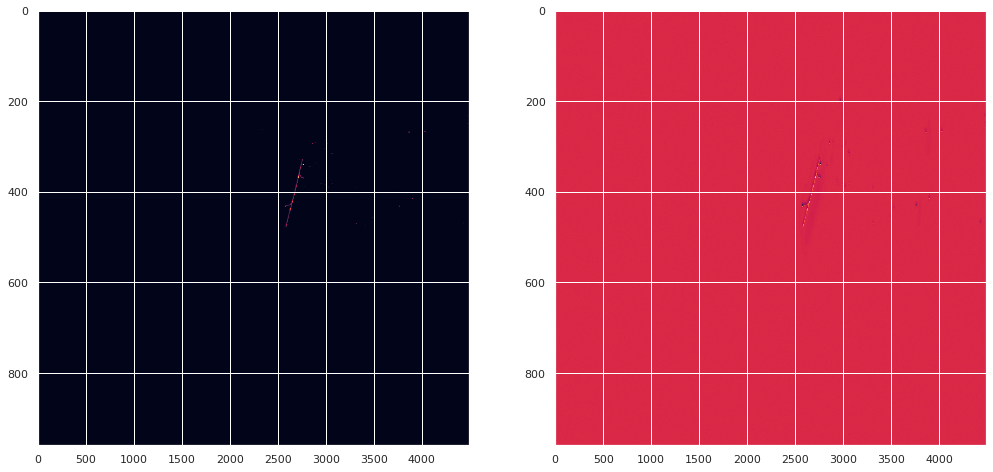

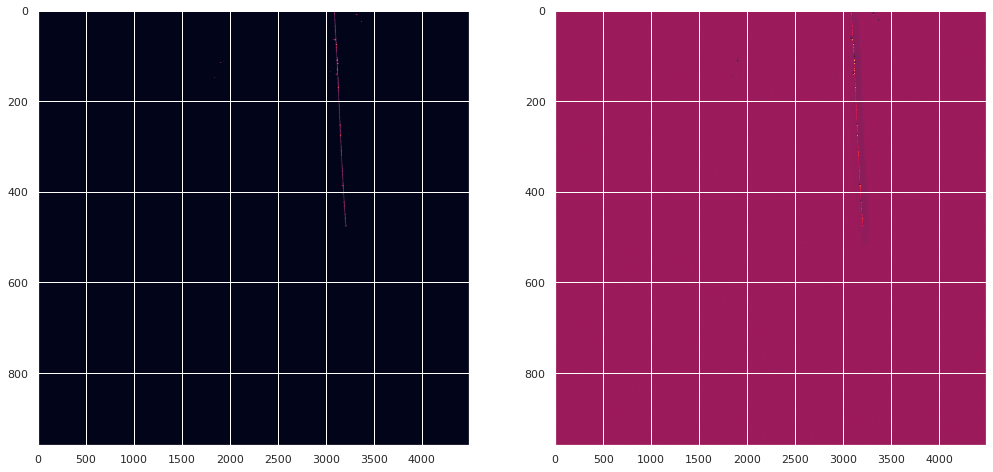

...

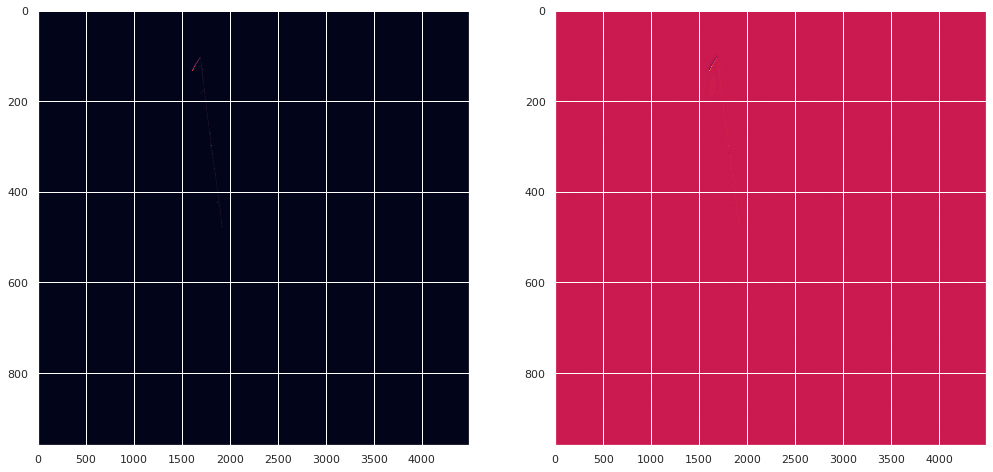

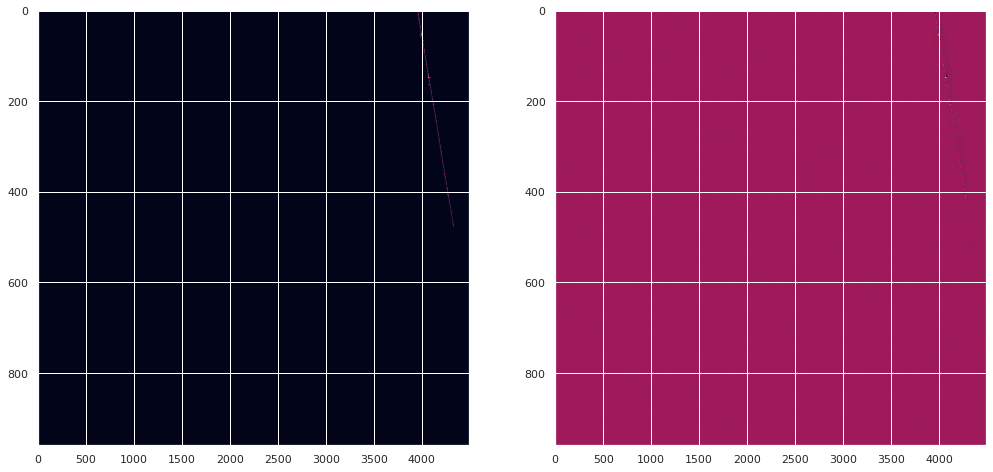

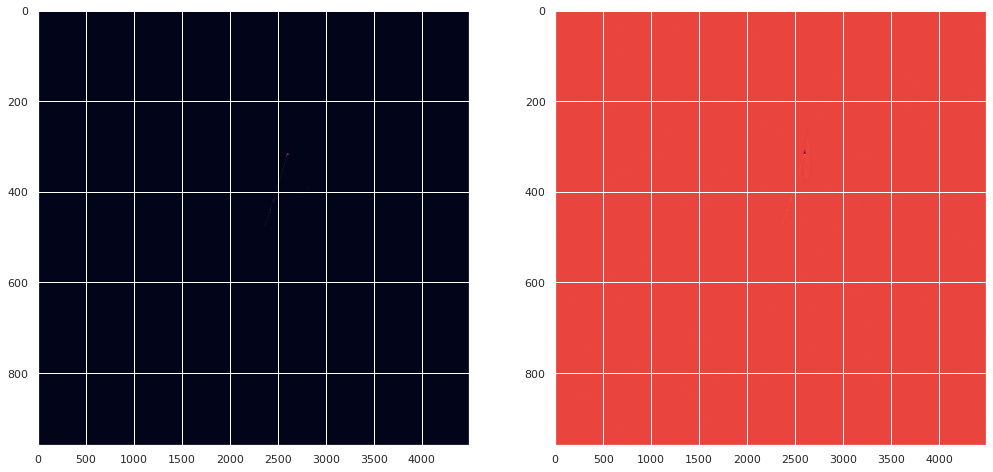

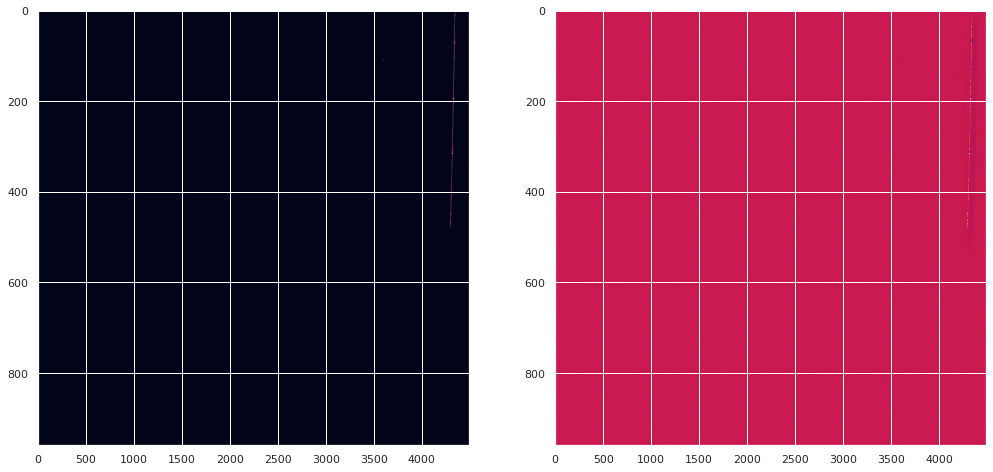

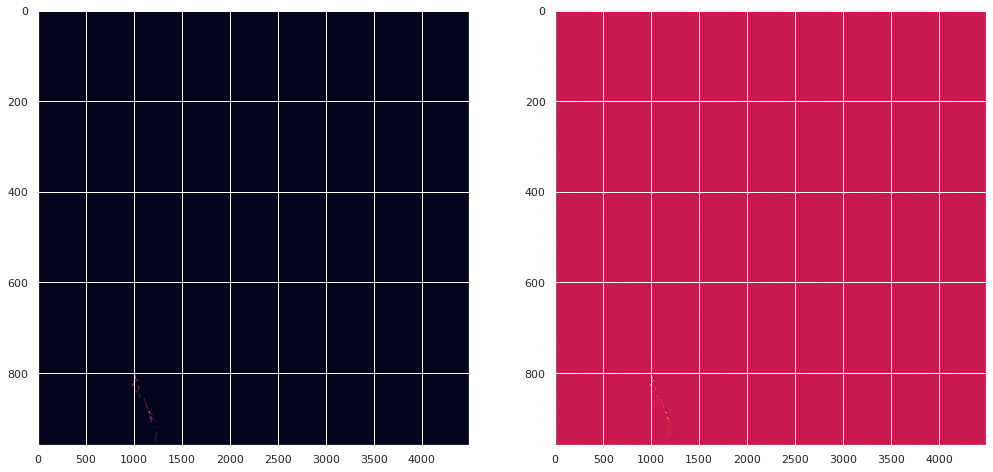

In [0]:

for image, noise in train_loader:
    fig = plt.figure(figsize=(17, 8))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ax1.imshow((image - noise).squeeze(), interpolation='nearest', aspect='auto')
    ax2.imshow((image - model(image.to(DEVICE)).data.to("cpu")).squeeze(),
               interpolation='nearest', aspect='auto')
    plt.show()